<a href="https://colab.research.google.com/github/Thisuli-Amanethmi/VoiceVoyage/blob/Thisuli/YOLOv8_CustomDatasetVersion8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Sun Feb 11 21:07:35 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install ultralytics

In [ ]:
!pip install --upgrade ultralytics


In [2]:
!pip install ultralytics==8.0.196


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 631.1/631.1 kB 4.0 MB/s eta 0:00:00


In [3]:
# INSTALL YOLOv8

from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo checks


Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)

OS                  Linux-6.1.58+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 12.67 GB
CPU                 Intel Xeon 2.30GHz
CUDA                12.1

matplotlib          ✅ 3.7.1>=3.3.0
numpy               ✅ 1.23.5>=1.22.2
opencv-python       ✅ 4.8.0.76>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.11.4>=1.4.1
torch               ✅ 2.1.0+cu121>=1.8.0
torchvision         ✅ 0.16.0+cu121>=0.9.0
tqdm                ✅ 4.66.1>=4.64.0
pandas              ✅ 1.5.3>=1.1.4
seaborn             ✅ 0.13.1>=0.11.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
thop                ✅ 0.1.1-2209072238>=0.1.1


**Train YOLOv8 Model on Custom Dataset**

In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="RRPASSpBZTefA9CAlVWa")
project = rf.workspace("dsgp-8kqpx").project("voice-voyage")
dataset = project.version(8).download("yolov8")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.8 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Voice-Voyage-8 in yolov8:: 100%|██████████| 1748/1748 [00:00<00:00, 6807.12it/s]


In [5]:
!yolo task=detect mode=train model=yolov8m.pt data=/content/Voice-Voyage-8/data.yaml epochs=100 imgsz=640


100% 49.7M/49.7M [00:00<00:00, 204MB/s]
New https://pypi.org/project/ultralytics/8.1.11 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/Voice-Voyage-8/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line

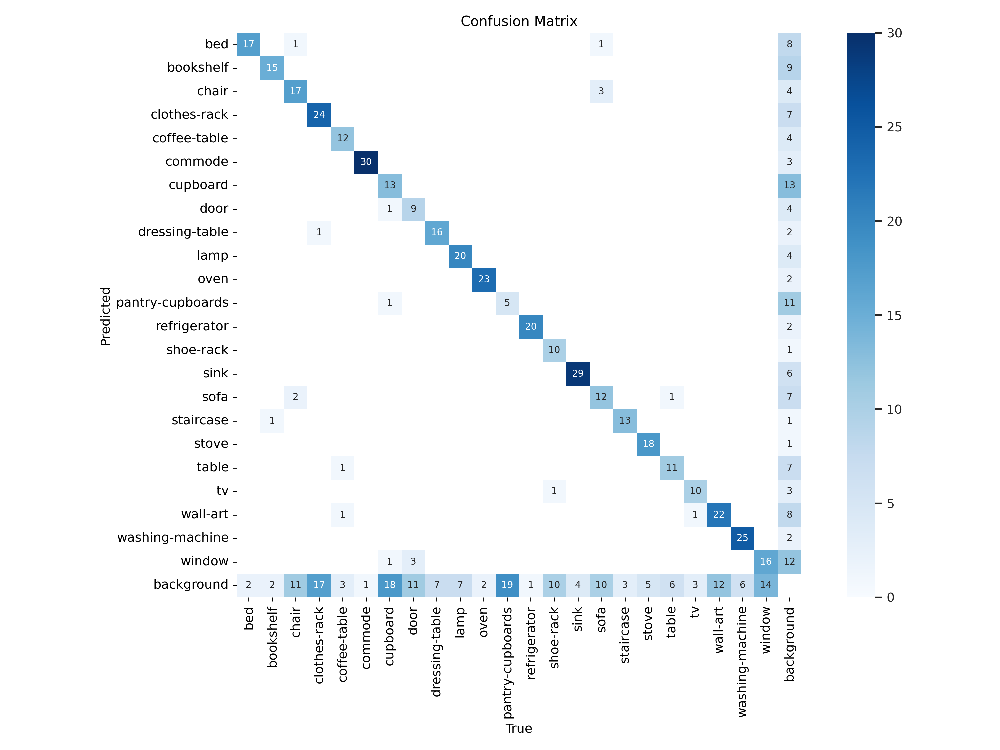

In [6]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)



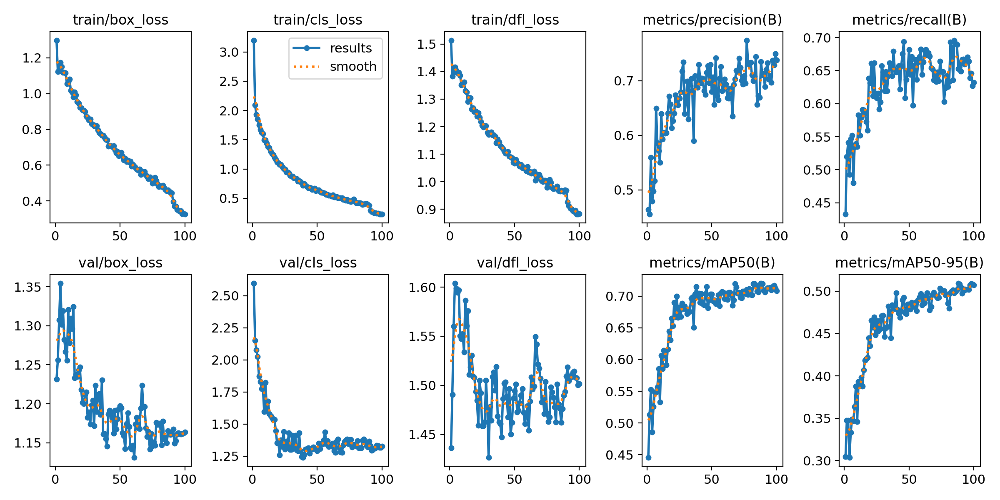

In [7]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)


**Validating - best.pt**

In [8]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data=/content/Voice-Voyage-8/data.yaml


Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25853077 parameters, 0 gradients, 78.8 GFLOPs
val: Scanning /content/Voice-Voyage-8/valid/labels.cache... 168 images, 1 backgrounds, 0 corrupt: 100% 168/168 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 11/11 [00:08<00:00,  1.31it/s]
                   all        168        581      0.735      0.653       0.72       0.51
                   bed        168         19       0.71      0.895      0.922      0.744
             bookshelf        168         18       0.69      0.833      0.827      0.479
                 chair        168         31      0.705      0.516      0.663      0.481
          clothes-rack        168         42      0.696      0.548      0.602      0.402
          coffee-table        168         17      0.853      0.684       0.78      0.591
               commode        168         3

**Detecting using best.pt**

In [11]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt data=/content/Voice-Voyage-8/data.yaml source='/content/runs/detect/predict/bathroom.jpg'
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt data=/content/Voice-Voyage-8/data.yaml source='/content/runs/detect/predict/bedroom.jpg'
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt data=/content/Voice-Voyage-8/data.yaml source='/content/runs/detect/predict/livingroom.jpg'
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt data=/content/Voice-Voyage-8/data.yaml source='/content/runs/detect/predict/closet.jpg'
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt data=/content/Voice-Voyage-8/data.yaml source='/content/runs/detect/predict/kitchen.jpg'



Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25853077 parameters, 0 gradients, 78.8 GFLOPs

image 1/1 /content/runs/detect/predict/bathroom.jpg: 448x640 (no detections), 73.8ms
Speed: 3.9ms preprocess, 73.8ms inference, 66.7ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25853077 parameters, 0 gradients, 78.8 GFLOPs

image 1/1 /content/runs/detect/predict/bedroom.jpg: 448x640 1 bed, 2 windows, 103.0ms
Speed: 3.3ms preprocess, 103.0ms inference, 475.2ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model sum

In [16]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt data=/content/Voice-Voyage-8/data.yaml source='/content/runs/detect/predict/bathrrom_2.jpg'


Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25853077 parameters, 0 gradients, 78.8 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/runs/detect/predict/bathrrom_2.jpg: 384x640 1 commode, 1 sink, 111.1ms
Speed: 3.0ms preprocess, 111.1ms inference, 587.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict7
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [19]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt data=/content/Voice-Voyage-8/data.yaml source='/content/runs/detect/predict/livingroom_2.jpg'


Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25853077 parameters, 0 gradients, 78.8 GFLOPs

image 1/1 /content/runs/detect/predict/livingroom_2.jpg: 448x640 1 coffee-table, 1 cupboard, 1 staircase, 1 tv, 71.8ms
Speed: 4.6ms preprocess, 71.8ms inference, 559.2ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict8
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [22]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt data=/content/Voice-Voyage-8/data.yaml source='/content/runs/detect/predict/livingroom_3.jpg'


Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25853077 parameters, 0 gradients, 78.8 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/runs/detect/predict/livingroom_3.jpg: 448x640 1 bookshelf, 1 sofa, 1 staircase, 2 tvs, 1 wall-art, 1 window, 109.1ms
Speed: 4.0ms preprocess, 109.1ms inference, 722.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict9
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [23]:
import os
import shutil

# Define the paths
prediction_folders = ['runs/detect/predict2', 'runs/detect/predict3', 'runs/detect/predict4', 'runs/detect/predict5', 'runs/detect/predict6', 'runs/detect/predict7', 'runs/detect/predict8', 'runs/detect/predict9']
output_folder = 'best_pt_all_predictions'

# Create the output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Iterate through each prediction folder
for folder in prediction_folders:
    # Get the list of files in the prediction folder
    files = os.listdir(folder)

    # Move or copy each file to the output folder
    for file in files:
        file_path = os.path.join(folder, file)
        if os.path.isfile(file_path):
            # You can choose to move or copy the file
            # shutil.move(file_path, output_folder)  # Move
            shutil.copy(file_path, output_folder)  # Copy

print("All predictions are gathered in the folder:", output_folder)


All predictions are gathered in the folder: best_pt_all_predictions


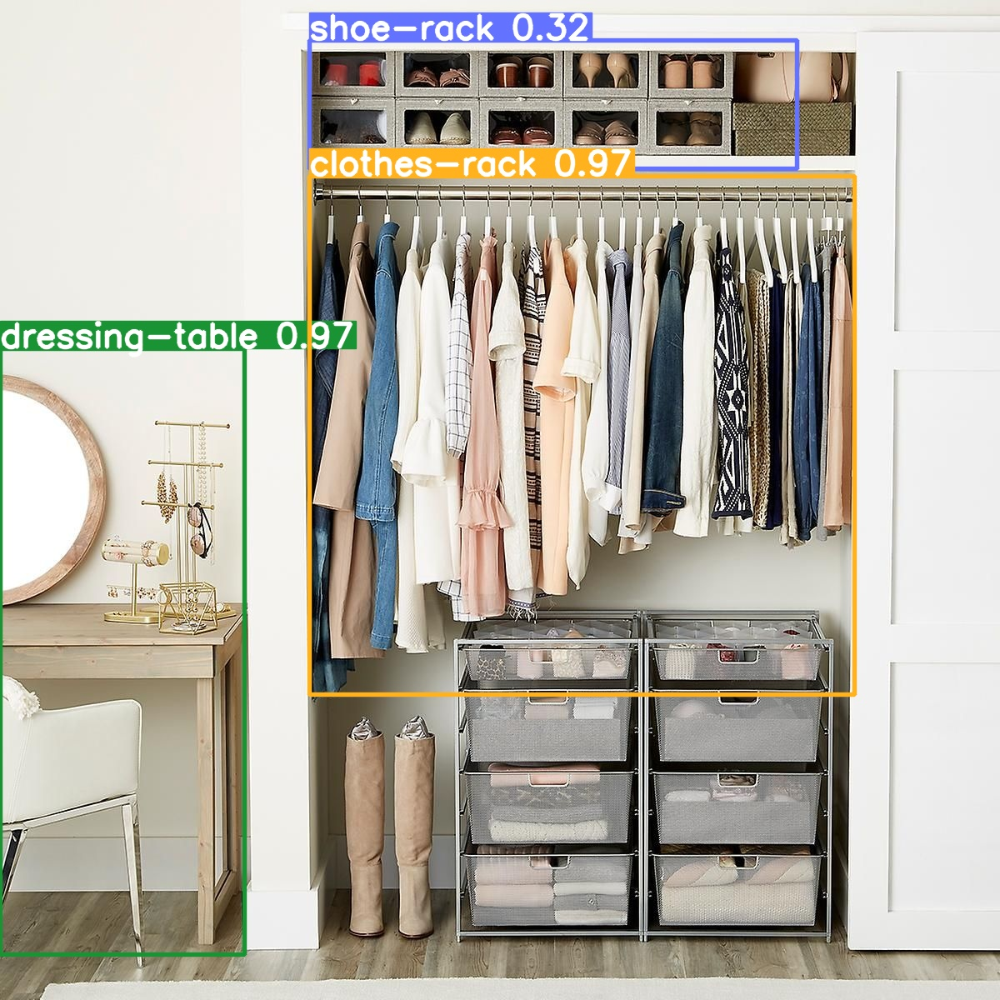

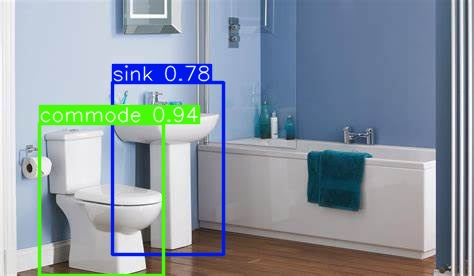

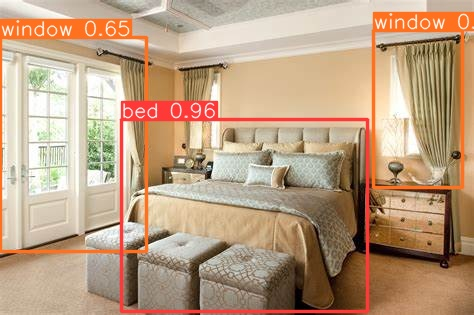

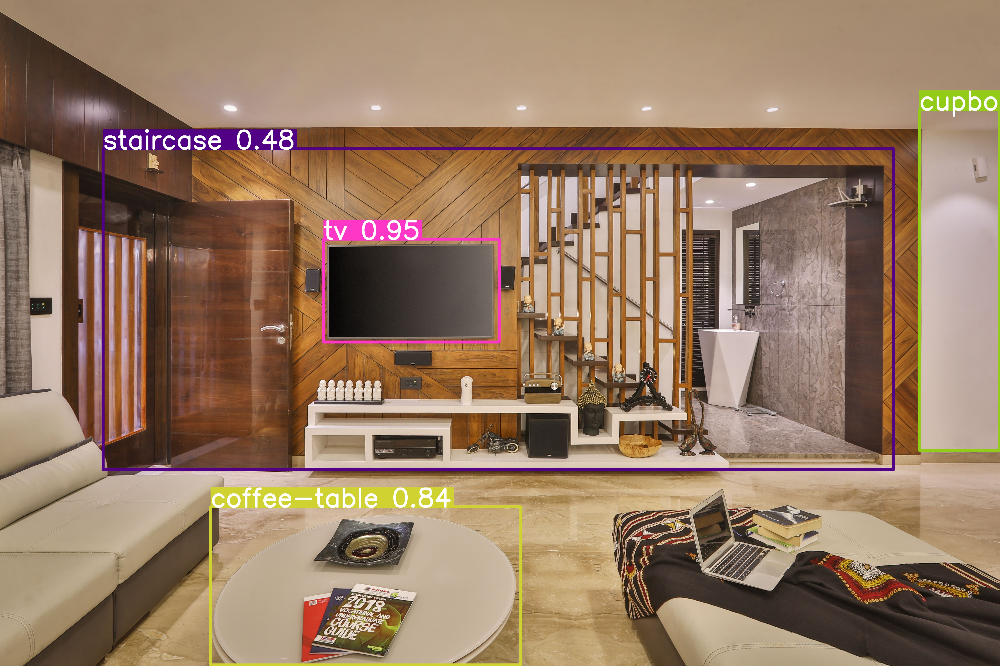

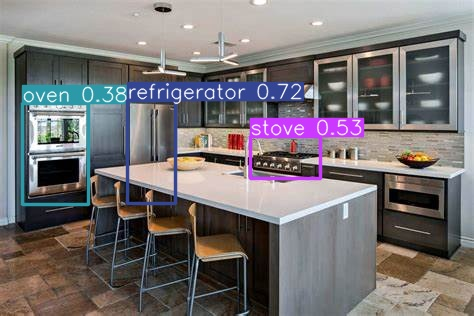

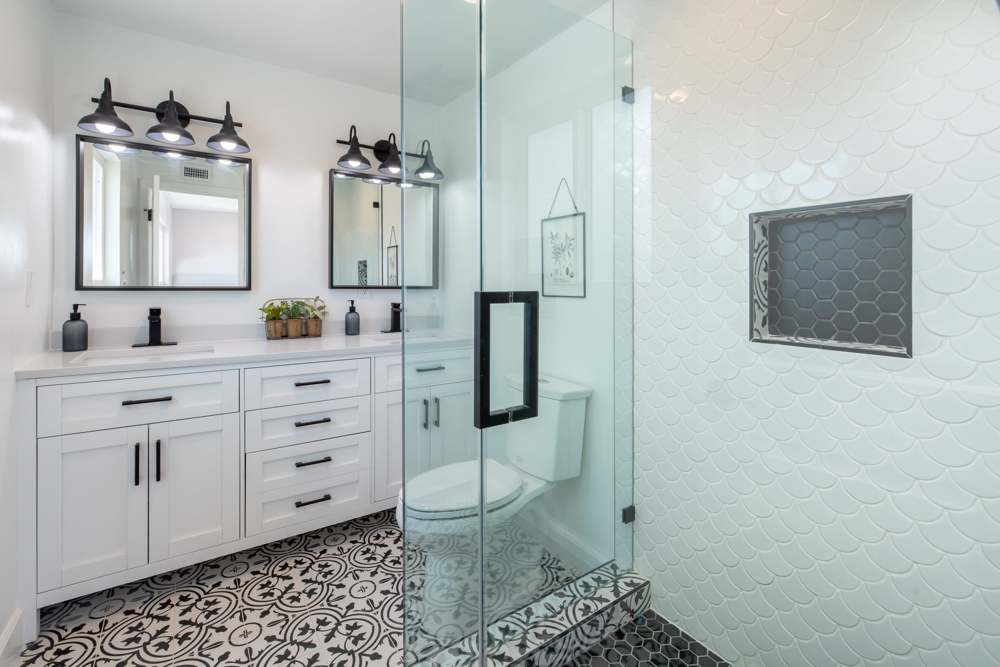

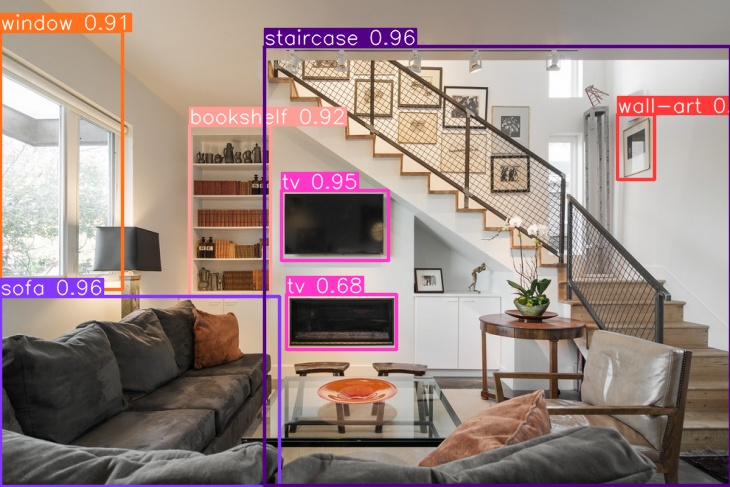

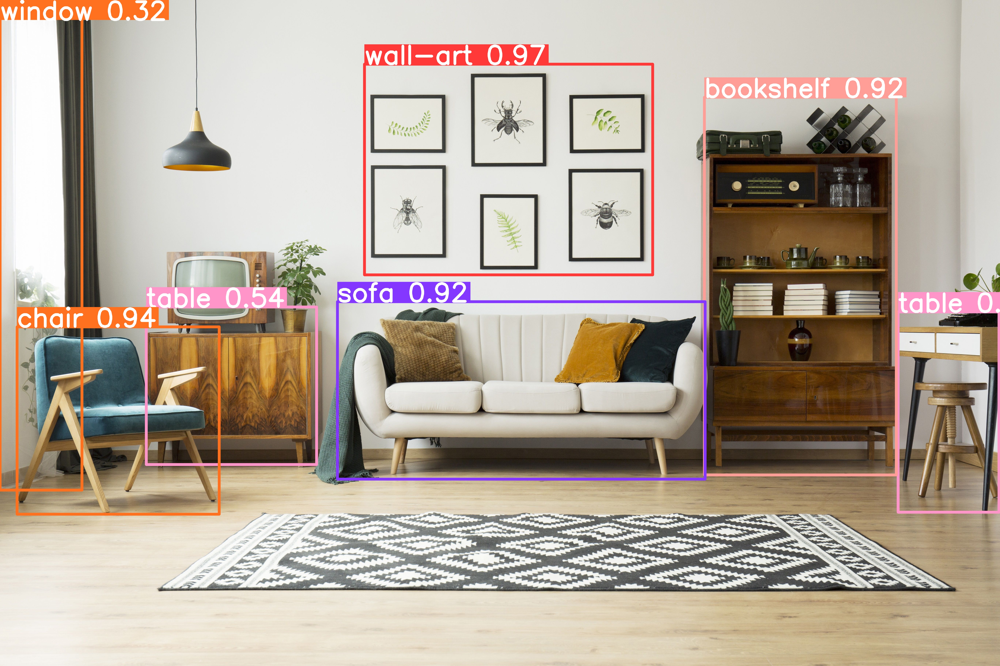

In [24]:
import glob
from IPython.display import Image, display


for image_path in glob.glob(f'/content/best_pt_all_predictions/*.jpg'):
  display(Image(filename=image_path, height=600))
  print("\n")


In [14]:
# accuracy of the model on the test dataset
!yolo val model=/content/runs/detect/train/weights/best.pt data=/content/Voice-Voyage-8/data.yaml split=test


Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25853077 parameters, 0 gradients, 78.8 GFLOPs
val: Scanning /content/Voice-Voyage-8/test/labels... 85 images, 0 backgrounds, 0 corrupt: 100% 85/85 [00:00<00:00, 751.19it/s]
val: New cache created: /content/Voice-Voyage-8/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 6/6 [00:06<00:00,  1.04s/it]
                   all         85        293      0.717      0.684      0.727      0.514
                   bed         85          9      0.666          1      0.746      0.455
             bookshelf         85         17      0.608      0.529      0.647      0.454
                 chair         85         14      0.679      0.857      0.856      0.575
          clothes-rack         85         16      0.915      0.675      0.761      0.546
          coffee-table         85         11      0.889      0.726   